In [1]:
import nltk 
from nltk.corpus import stopwords    
stop_words = set(stopwords.words('english'))

from nltk.tag import pos_tag
from nltk import word_tokenize
from collections import Counter

import textstat
from lexicalrichness import LexicalRichness
from nltk import ConditionalFreqDist
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
import pandas as pd
import plotly as ply
import numpy as np
ply.offline.init_notebook_mode(connected=False)


from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix  
from sklearn.metrics import accuracy_score
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
import sys

In [2]:
pd.set_option('display.max_columns', 500)

#df = pd.read_csv('/Users/rujunguan/Downloads/corona_fake.csv')
df = pd.read_csv('/Users/rujunguan/Downloads/corna_fake_3_1_2_1.csv',engine='python', index_col=0)
df.loc[df['label'] == 'Fake', ['label']] = 'FAKE'
df.loc[df['label'] == 'fake', ['label']] = 'FAKE'
df.loc[df['label'] == 'real', ['label']] = 'TRUE'
df.loc[df['publication'] == 'facebook', ['publication']] = 'Facebook'
df.content.fillna(df.title, inplace=True)

#df.loc[5]['label'] = 'FAKE'
#df.loc[15]['label'] = 'TRUE'
#df.loc[43]['label'] = 'FAKE'
#df.loc[131]['label'] = 'TRUE'
#df.loc[242]['label'] = 'FAKE'

df = df.sample(frac=1).reset_index(drop=True)
df.title.fillna('missing', inplace=True)
df.publication.fillna('missing', inplace=True)
df.content.fillna('missing', inplace=True)
df.dropna(inplace=True)
print(df)

                                                   title  \
0      What are the age groups of coronavirus deaths ...   
1      Indore Police make lockdown violators do frog ...   
2      Australia to pursue coronavirus investigation ...   
3       All U.S. citizens are entitled to $700 per we...   
4                        March 19, 2020 coronavirus news   
...                                                  ...   
21844  Streaming apps Netflix and Amazon Prime give f...   
21845  12-yr-old girl dies while trying to walk 150 k...   
21846  List of Grocery Stores with Special Hours for ...   
21847                                            missing   
21848  Italians bidding goodbye to the world because ...   

                                                 content  \
0      The government on Saturday revealed that 14.4%...   
1      The Indore Police made people perform jumping ...   
2      Australia will push for an international inves...   
3      The claim has appeared in severa

In [3]:
df['title_num_uppercase'] = df['title'].str.count(r'[A-Z]')
df['text_num_uppercase'] = df['content'].str.count(r'[A-Z]')
df['text_len'] = df['content'].str.len()
df['text_pct_uppercase'] = df.text_num_uppercase.div(df.text_len)

x1 = df.loc[df['label']=='TRUE']['title_num_uppercase']
x2 = df.loc[df['label'] == 'FAKE']['title_num_uppercase']
group_labels = ['TRUE', 'FAKE']
colors = ['rgb(0, 0, 100)', 'rgb(0, 200, 200)']


fig = ff.create_distplot(
    [x1, x2], group_labels,colors=colors)

fig.update_layout(title_text='Distribution of Uppercase in title', template="plotly_white")

ply.offline.iplot(fig)

In [4]:
df['title_num_uppercase'] = df['title'].str.count(r'[A-Z]')
df['text_num_uppercase'] = df['content'].str.count(r'[A-Z]')
df['text_len'] = df['content'].str.len()
df['text_pct_uppercase'] = df.text_num_uppercase.div(df.text_len)

x1 = df.loc[df['label']=='TRUE']['title_num_uppercase']
x2 = df.loc[df['label'] == 'FAKE']['title_num_uppercase']
group_labels = ['TRUE', 'FAKE']
colors = ['rgb(0, 0, 100)', 'rgb(0, 200, 200)']


fig = ff.create_distplot(
    [x1, x2], group_labels,colors=colors)

fig.update_layout(title_text='Distribution of Uppercase in title', template="plotly_white")

ply.offline.iplot(fig)

In [5]:
fig = go.Figure()
fig.add_trace(go.Box(y=x1, name='TRUE',
                marker_color = 'rgb(0, 0, 100)'))
fig.add_trace(go.Box(y=x2, name = 'FAKE',
                marker_color = 'rgb(0, 200, 200)'))
fig.update_layout(title_text='Box plot of Capital Letter in title', template="plotly_white")
fig.show()

In [6]:
df['title_num_stop_words'] = df['title'].str.split().apply(lambda x: len(set(x) & stop_words))
df['text_num_stop_words'] = df['content'].str.split().apply(lambda x: len(set(x) & stop_words))
df['text_word_count'] = df['content'].apply(lambda x: len(str(x).split()))
df['text_pct_stop_words'] = df['text_num_stop_words'] / df['text_word_count']

x1 = df.loc[df['label']=='TRUE']['title_num_stop_words']
x2 = df.loc[df['label'] == 'FAKE']['title_num_stop_words']
group_labels = ['TRUE', 'FAKE']
colors = ['rgb(0, 0, 100)', 'rgb(0, 200, 200)']

fig = ff.create_distplot(
    [x1, x2], group_labels,colors=colors)

fig.update_layout(title_text='Distribution of Stop Words in title', template="plotly_white")
fig.show()

In [7]:
fig = go.Figure()
fig.add_trace(go.Box(y=x1, name='TRUE',
                marker_color = 'rgb(0, 0, 100)'))
fig.add_trace(go.Box(y=x2, name = 'FAKE',
                marker_color = 'rgb(0, 200, 200)'))
fig.update_layout(title_text='Box plot of Stop Words in title', template="plotly_white")
fig.show()

In [8]:
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/rujunguan/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [9]:
df.drop(['text_num_uppercase', 'text_len', 'text_num_stop_words', 'text_word_count'], axis=1, inplace=True)

df['token'] = df.apply(lambda row: nltk.word_tokenize(row['title']), axis=1)
df['pos_tags'] = df.apply(lambda row: nltk.pos_tag(row['token']), axis=1)

tag_count_df = pd.DataFrame(df['pos_tags'].map(lambda x: Counter(tag[1] for tag in x)).to_list())
df = pd.concat([df, tag_count_df], axis=1).fillna(0).drop(['pos_tags', 'token'], axis=1)

df = df[['title', 'content', 'publication', 'label', 'title_num_uppercase', 'text_pct_uppercase', 'title_num_stop_words', 'text_pct_stop_words', 'NNP']].rename(columns={'NNP': 'NNP_title'})

x1 = df.loc[df['label']=='TRUE']['NNP_title']
x2 = df.loc[df['label'] == 'FAKE']['NNP_title']

group_labels = ['TRUE', 'FAKE']

colors = ['rgb(0, 0, 100)', 'rgb(0, 200, 200)']

fig = ff.create_distplot(
    [x1, x2], group_labels,colors=colors)

fig.update_layout(title_text='Number of Proper nouns in title', template="plotly_white")
fig.show()

In [10]:
fig = go.Figure()
fig.add_trace(go.Box(y=x1, name='TRUE',
                marker_color = 'rgb(0, 0, 100)'))
fig.add_trace(go.Box(y=x2, name = 'FAKE',
                marker_color = 'rgb(0, 200, 200)'))
fig.update_layout(title_text='Box plot of Proper nouns in title', template="plotly_white")
fig.show()

In [11]:
df['token'] = df.apply(lambda row: nltk.word_tokenize(row['content']), axis=1)
df['pos_tags'] = df.apply(lambda row: nltk.pos_tag(row['token']), axis=1)

tag_count_df = pd.DataFrame(df['pos_tags'].map(lambda x: Counter(tag[1] for tag in x)).to_list())

df = pd.concat([df, tag_count_df], axis=1).fillna(0).drop(['pos_tags', 'token'], axis=1)
df['num_negation'] = df['content'].str.lower().str.count("no|not|never|none|nothing|nobody|neither|nowhere|hardly|scarcely|barely|doesn’t|isn’t|wasn’t|shouldn’t|wouldn’t|couldn’t|won’t|can't|don't")

df['num_interrogatives_title'] = df['title'].str.lower().str.count("what|who|when|where|which|why|how")
df['num_interrogatives_text'] = df['content'].str.lower().str.count("what|who|when|where|which|why|how")



In [12]:
reading_ease = []
for doc in df['content']:
    reading_ease.append(textstat.flesch_reading_ease(str(doc)))
    
smog = []
for doc in df['content']:
    smog.append(textstat.smog_index(str(doc)))
    
kincaid_grade = []
for doc in df['content']:
    kincaid_grade.append(textstat.flesch_kincaid_grade(str(doc)))
    
liau_index = []
for doc in df['content']:
    liau_index.append(textstat.coleman_liau_index(str(doc)))
    
readability_index = []
for doc in df['content']:
    readability_index.append(textstat.automated_readability_index(str(doc)))

readability_score = []
for doc in df['content']:
    readability_score.append(textstat.dale_chall_readability_score(str(doc)))
    
difficult_words = []
for doc in df['content']:
    difficult_words.append(textstat.difficult_words(str(doc)))

write_formula = []
for doc in df['content']:
    write_formula.append(textstat.linsear_write_formula(str(doc)))

gunning_fog = []
for doc in df['content']:
    gunning_fog.append(textstat.gunning_fog(str(doc)))

text_standard = []
for doc in df['content']:
    text_standard.append(textstat.text_standard(str(doc)))
    
df['flesch_reading_ease'] = reading_ease
df['smog_index'] = smog
df['flesch_kincaid_grade'] = kincaid_grade
df['automated_readability_index'] = readability_index
df['dale_chall_readability_score'] = readability_score
df['difficult_words'] = difficult_words
df['linsear_write_formula'] = write_formula
df['gunning_fog'] = gunning_fog
df['text_standard'] = text_standard
# readability, complexity and grade level of any article

In [13]:
 # total number of unique words (types) divided by the total number of words (tokens)
df['num_powerWords_text'] = df['content'].str.lower().str.count('improve|trust|immediately|discover|profit|learn|know|understand|powerful|best|win|more|bonus|exclusive|extra|you|free|health|guarantee|new|proven|safety|money|now|today|results|protect|help|easy|amazing|latest|extraordinary|how to|worst|ultimate|hot|first|big|anniversary|premiere|basic|complete|save|plus|create')
df['num_casualWords_text'] = df['content'].str.lower().str.count('make|because|how|why|change|use|since|reason|therefore|result')
df['num_tentativeWords_text'] = df['content'].str.lower().str.count('may|might|can|could|possibly|probably|it is likely|it is unlikely|it is possible|it is probable|tends to|appears to|suggests that|seems to')
df['num_emotionWords_text'] = df['content'].str.lower().str.count('ordeal|outrageous|provoke|repulsive|scandal|severe|shameful|shocking|terrible|tragic|unreliable|unstable|wicked|aggravate|agony|appalled|atrocious|corruption|damage|disastrous|disgusted|dreadful|eliminate|harmful|harsh|inconsiderate|enraged|offensive|aggressive|frustrated|controlling|resentful|anger|sad|fear|malicious|infuriated|critical|violent|vindictive|furious|contrary|condemning|sarcastic|poisonous|jealous|retaliating|desperate|alienated|unjustified|violated')

In [14]:
x1 = df.loc[df['label']=='TRUE']['text_pct_uppercase']
x2 = df.loc[df['label'] == 'FAKE']['text_pct_uppercase']

group_labels = ['TRUE', 'FAKE']

colors = ['rgb(0, 0, 100)', 'rgb(0, 200, 200)']

fig = ff.create_distplot(
    [x1, x2], group_labels,colors=colors)

fig.update_layout(title_text='Percentage of Capital Letter in Article body', template="plotly_white")
fig.show()

In [16]:
x1 = df.loc[df['label']=='TRUE']['text_pct_stop_words']
x2 = df.loc[df['label'] == 'FAKE']['text_pct_stop_words']

group_labels = ['TRUE', 'FAKE']

colors = ['rgb(0, 0, 100)', 'rgb(0, 200, 200)']

fig = ff.create_distplot(
    [x1, x2], group_labels,colors=colors)

fig.update_layout(title_text='Percentage of Stop Words in Text', template="plotly_white")
fig.show()

In [17]:
x1 = df.loc[df['label']=='TRUE']['NNP']
x2 = df.loc[df['label'] == 'FAKE']['NNP']

group_labels = ['TRUE', 'FAKE']

colors = ['rgb(0, 0, 100)', 'rgb(0, 200, 200)']

fig = ff.create_distplot(
    [x1, x2], group_labels,colors=colors)

fig.update_layout(title_text='Number of Proper noun in Article Body', template="plotly_white")
fig.show()

In [18]:
x1 = df.loc[df['label']=='TRUE']['num_negation']
x2 = df.loc[df['label'] == 'FAKE']['num_negation']

group_labels = ['TRUE', 'FAKE']

colors = ['rgb(0, 0, 100)', 'rgb(0, 200, 200)']

fig = ff.create_distplot(
    [x1, x2], group_labels,colors=colors)

fig.update_layout(title_text='Number of Negations in Text', template="plotly_white")
fig.show()

In [18]:
fig = go.Figure()
fig.add_trace(go.Box(y=x1, name='TRUE',
                marker_color = 'rgb(0, 0, 100)'))
fig.add_trace(go.Box(y=x2, name = 'FAKE',
                marker_color = 'rgb(0, 200, 200)'))
fig.update_layout(title_text='Box plot of Brackets in Article Bodies', template="plotly_white")
fig.show()

In [19]:
df

,title,content,publication,label,title_num_uppercase,text_pct_uppercase,title_num_stop_words,text_pct_stop_words,NNP_title,CD,NNS,IN,NN,PRP,VBP,JJ,RB,VB,DT,",",NNP,VBZ,VBN,TO,RBS,PDT,.,PRP$,MD,VBG,JJS,WRB,NNPS,VBD,WP,CC,POS,:,EX,JJR,``,RP,'',WDT,(,),RBR,$,UH,#,FW,WP$,SYM,LS,num_negation,num_interrogatives_title,num_interrogatives_text,flesch_reading_ease,smog_index,flesch_kincaid_grade,automated_readability_index,dale_chall_readability_score,difficult_words,linsear_write_formula,gunning_fog,text_standard,num_powerWords_text,num_casualWords_text,num_tentativeWords_text,num_emotionWords_text
0,Liberal MSNBC’s Chris Matthews Makes Unbelieva...,0 comments \nIn case you didn’t already know t...,ihavethetruth,FAKE,20,0.050717,0,0.187500,9.0,2.0,6.0,21.0,20.0,13.0,10.0,14.0,11.0,11.0,16.0,6.0,18.0,8.0,4.0,7.0,1.0,1.0,11.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0,2,73.61,9.6,8.7,12.0,7.93,32,8.500000,11.16,8th and 9th grade,12,4,3,2
1,Runny nose? Cough? You too can get a COVID-19 ...,The Northwest Territories is developing new cr...,https://www.cbc.ca/news/canada/north/nwt-openi...,TRUE,11,0.033420,5,0.104240,3.0,21.0,44.0,71.0,66.0,14.0,19.0,44.0,17.0,31.0,43.0,34.0,44.0,14.0,25.0,26.0,0.0,0.0,29.0,5.0,12.0,26.0,1.0,2.0,2.0,12.0,7.0,14.0,2.0,2.0,3.0,5.0,3.0,2.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12,0,10,22.49,19.1,24.2,30.9,9.35,104,13.200000,26.53,12th and 13th grade,21,3,7,1
2,Why isn't T'gana releasing more info in COVID-...,Opposition BJP and Congress in Telangana have ...,https://www.thenewsminute.com/article/why-isn-...,TRUE,8,0.065823,3,0.203390,2.0,0.0,1.0,6.0,10.0,0.0,1.0,6.0,1.0,2.0,4.0,2.0,18.0,0.0,2.0,1.0,0.0,0.0,3.0,0.0,0.0,1.0,0.0,0.0,0.0,3.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0,43.02,14.6,12.2,15.3,9.43,18,13.833333,12.63,14th and 15th grade,1,0,0,0
3,missing,"And what's next, everyone will swallow and sit...",Denis chernomazov,FAKE,0,0.024194,0,0.272727,0.0,0.0,0.0,1.0,3.0,0.0,0.0,1.0,1.0,4.0,1.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,66.07,0.0,9.5,11.6,6.16,2,12.000000,8.80,8th and 9th grade,0,0,0,0
4,Why a flatter curve does not mean we've won th...,"This column is an opinion by James Downar, Max...",https://www.cbc.ca/news/opinion/opinion-covid-...,TRUE,6,0.029492,5,0.070907,1.0,15.0,47.0,127.0,155.0,30.0,31.0,78.0,38.0,44.0,102.0,46.0,80.0,30.0,21.0,31.0,2.0,0.0,38.0,10.0,17.0,18.0,1.0,4.0,15.0,12.0,5.0,34.0,2.0,2.0,1.0,6.0,10.0,3.0,10.0,6.0,5.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10,1,16,34.02,17.2,17.7,21.2,8.22,167,11.333333,18.26,17th and 18th grade,30,13,30,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21844,Videotutorial: Insertando formas en el Microso...,Domino’s presenta la nueva pizza de ayer recal...,elmundotoday,FAKE,4,0.187879,0,0.018519,3.0,0.0,1.0,3.0,14.0,0.0,1.0,6.0,0.0,0.0,1.0,1.0,21.0,2.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,2,0,0,57.77,11.2,8.6,9.5,10.15,20,7.750000,11.33,9th and 10th grade,0,0,0,0
21845,Ottawa River residents prepare for flooding — ...,As some Ottawa residents prepare this weekend ...,https://www.cbc.ca/news/canada/ottawa/flood-pr...,TRUE,2,0.035505,2,0.110000,2.0,12.0,45.0,75.0,80.0,29.0,18.0,39.0,29.0,28.0,45.0,41.0,64.0,18.0,12.0,22.0,1.0,1.0,22.0,7.0,12.0,15.0,0.0,3.0,0.0,20.0,3.0,21.0,4.0,1.0,4.0,2.0,8.0,1.0,9.0,2.0,3.0,3.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,17,0,9,47.90,14.1,16.5,22.0,8.36,104,30.000000,18.56,16th and 17th grade,14,6,9,0
21846,The Zika Virus Is Harmless - It Does Not Cause...,The Zika Virus Is Har

In [20]:
import tensorflow as tf
from tensorflow.keras.layers import LSTM, GRU, Dense, Embedding, Dropout
from tensorflow.keras.preprocessing import text, sequence 
from tensorflow.keras.models import Sequential
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
#for text cleaning
import string
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
#for visualization
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

In [21]:
def clean_text(txt):
    """""
    cleans the input text in the following steps
    1- replace contractions
    2- removing punctuation
    3- spliting into words
    4- removing stopwords
    5- removing leftover punctuations
    """""
    contraction_dict = {"ain't": "is not", "aren't": "are not","can't": "cannot", "'cause": "because", "could've": "could have", "couldn't": "could not", "didn't": "did not",  "doesn't": "does not", "don't": "do not", "hadn't": "had not", "hasn't": "has not", "haven't": "have not", "he'd": "he would","he'll": "he will", "he's": "he is", "how'd": "how did", "how'd'y": "how do you", "how'll": "how will", "how's": "how is",  "I'd": "I would", "I'd've": "I would have", "I'll": "I will", "I'll've": "I will have","I'm": "I am", "I've": "I have", "i'd": "i would", "i'd've": "i would have", "i'll": "i will",  "i'll've": "i will have","i'm": "i am", "i've": "i have", "isn't": "is not", "it'd": "it would", "it'd've": "it would have", "it'll": "it will", "it'll've": "it will have","it's": "it is", "let's": "let us", "ma'am": "madam", "mayn't": "may not", "might've": "might have","mightn't": "might not","mightn't've": "might not have", "must've": "must have", "mustn't": "must not", "mustn't've": "must not have", "needn't": "need not", "needn't've": "need not have","o'clock": "of the clock", "oughtn't": "ought not", "oughtn't've": "ought not have", "shan't": "shall not", "sha'n't": "shall not", "shan't've": "shall not have", "she'd": "she would", "she'd've": "she would have", "she'll": "she will", "she'll've": "she will have", "she's": "she is", "should've": "should have", "shouldn't": "should not", "shouldn't've": "should not have", "so've": "so have","so's": "so as", "this's": "this is","that'd": "that would", "that'd've": "that would have", "that's": "that is", "there'd": "there would", "there'd've": "there would have", "there's": "there is", "here's": "here is","they'd": "they would", "they'd've": "they would have", "they'll": "they will", "they'll've": "they will have", "they're": "they are", "they've": "they have", "to've": "to have", "wasn't": "was not", "we'd": "we would", "we'd've": "we would have", "we'll": "we will", "we'll've": "we will have", "we're": "we are", "we've": "we have", "weren't": "were not", "what'll": "what will", "what'll've": "what will have", "what're": "what are",  "what's": "what is", "what've": "what have", "when's": "when is", "when've": "when have", "where'd": "where did", "where's": "where is", "where've": "where have", "who'll": "who will", "who'll've": "who will have", "who's": "who is", "who've": "who have", "why's": "why is", "why've": "why have", "will've": "will have", "won't": "will not", "won't've": "will not have", "would've": "would have", "wouldn't": "would not", "wouldn't've": "would not have", "y'all": "you all", "y'all'd": "you all would","y'all'd've": "you all would have","y'all're": "you all are","y'all've": "you all have","you'd": "you would", "you'd've": "you would have", "you'll": "you will", "you'll've": "you will have", "you're": "you are", "you've": "you have"}
    def _get_contractions(contraction_dict):
        contraction_re = re.compile('(%s)' % '|'.join(contraction_dict.keys()))
        return contraction_dict, contraction_re

    def replace_contractions(text):
        contractions, contractions_re = _get_contractions(contraction_dict)
        def replace(match):
            return contractions[match.group(0)]
        return contractions_re.sub(replace, text)

    # replace contractions
    txt = replace_contractions(txt)
    
    #remove punctuations
    txt  = "".join([char for char in txt if char not in string.punctuation])
    txt = re.sub('[0-9]+', '', txt)
    
    # split into words
    words = word_tokenize(txt)
    
    # remove stopwords
    stop_words = set(stopwords.words('english'))
    words = [w for w in words if not w in stop_words]
    
    # removing leftover punctuations
    words = [word for word in words if word.isalpha()]
    
    cleaned_text = ' '.join(words)
    return cleaned_text
    
df['data_cleaned'] = df['title'].apply(lambda txt: clean_text(txt))
df['data_cleaned']

0        What age groups coronavirus deaths reported In...
1        Indore Police make lockdown violators frog jum...
2        Australia pursue coronavirus investigation Wor...
3        All US citizens entitled per week stay home av...
4                                   March coronavirus news
                               ...                        
21844    Streaming apps Netflix Amazon Prime give free ...
21845    yrold girl dies trying walk km Telangana Chhat...
21846    List Grocery Stores Special Hours Seniors AtRi...
21847                                              missing
21848           Italians bidding goodbye world coronavirus
Name: data_cleaned, Length: 21849, dtype: object

In [46]:
df

,title,content,publication,label,title_num_uppercase,text_pct_uppercase,title_num_stop_words,text_pct_stop_words,NNP_title,CD,NNS,IN,NN,PRP,VBP,JJ,RB,VB,DT,",",NNP,VBZ,VBN,TO,RBS,PDT,.,PRP$,MD,VBG,JJS,WRB,NNPS,VBD,WP,CC,POS,:,EX,JJR,``,RP,'',WDT,(,),RBR,$,UH,#,FW,WP$,SYM,LS,num_negation,num_interrogatives_title,num_interrogatives_text,flesch_reading_ease,smog_index,flesch_kincaid_grade,automated_readability_index,dale_chall_readability_score,difficult_words,linsear_write_formula,gunning_fog,text_standard,num_powerWords_text,num_casualWords_text,num_tentativeWords_text,num_emotionWords_text,data_cleaned
0,Liberal MSNBC’s Chris Matthews Makes Unbelieva...,0 comments \nIn case you didn’t already know t...,ihavethetruth,0,20,0.050717,0,0.187500,9.0,2.0,6.0,21.0,20.0,13.0,10.0,14.0,11.0,11.0,16.0,6.0,18.0,8.0,4.0,7.0,1.0,1.0,11.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0,2,73.61,9.6,8.7,12.0,7.93,32,8.500000,11.16,8th and 9th grade,12,4,3,2,Liberal MSNBC Chris Matthews Makes Unbelievabl...
1,Runny nose? Cough? You too can get a COVID-19 ...,The Northwest Territories is developing new cr...,https://www.cbc.ca/news/canada/north/nwt-openi...,1,11,0.033420,5,0.104240,3.0,21.0,44.0,71.0,66.0,14.0,19.0,44.0,17.0,31.0,43.0,34.0,44.0,14.0,25.0,26.0,0.0,0.0,29.0,5.0,12.0,26.0,1.0,2.0,2.0,12.0,7.0,14.0,2.0,2.0,3.0,5.0,3.0,2.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12,0,10,22.49,19.1,24.2,30.9,9.35,104,13.200000,26.53,12th and 13th grade,21,3,7,1,Runny nose Cough You get COVID test NWT
2,Why isn't T'gana releasing more info in COVID-...,Opposition BJP and Congress in Telangana have ...,https://www.thenewsminute.com/article/why-isn-...,1,8,0.065823,3,0.203390,2.0,0.0,1.0,6.0,10.0,0.0,1.0,6.0,1.0,2.0,4.0,2.0,18.0,0.0,2.0,1.0,0.0,0.0,3.0,0.0,0.0,1.0,0.0,0.0,0.0,3.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0,43.02,14.6,12.2,15.3,9.43,18,13.833333,12.63,14th and 15th grade,1,0,0,0,Why Tgana releasing info COVID bulletins Oppn
3,missing,"And what's next, everyone will swallow and sit...",Denis chernomazov,0,0,0.024194,0,0.272727,0.0,0.0,0.0,1.0,3.0,0.0,0.0,1.0,1.0,4.0,1.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1,66.07,0.0,9.5,11.6,6.16,2,12.000000,8.80,8th and 9th grade,0,0,0,0,missing
4,Why a flatter curve does not mean we've won th...,"This column is an opinion by James Downar, Max...",https://www.cbc.ca/news/opinion/opinion-covid-...,1,6,0.029492,5,0.070907,1.0,15.0,47.0,127.0,155.0,30.0,31.0,78.0,38.0,44.0,102.0,46.0,80.0,30.0,21.0,31.0,2.0,0.0,38.0,10.0,17.0,18.0,1.0,4.0,15.0,12.0,5.0,34.0,2.0,2.0,1.0,6.0,10.0,3.0,10.0,6.0,5.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10,1,16,34.02,17.2,17.7,21.2,8.22,167,11.333333,18.26,17th and 18th grade,30,13,30,4,Why flatter curve mean COVID battle
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21844,Videotutorial: Insertando formas en el Microso...,Domino’s presenta la nueva pizza de ayer recal...,elmundotoday,0,4,0.187879,0,0.018519,3.0,0.0,1.0,3.0,14.0,0.0,1.0,6.0,0.0,0.0,1.0,1.0,21.0,2.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,2,0,0,57.77,11.2,8.6,9.5,10.15,20,7.750000,11.33,9th and 10th grade,0,0,0,0,Videotutorial Insertando formas en el Microsof...
21845,Ottawa River residents prepare for flooding — ...,As some Ottawa residents prepare this weekend ...,https://www.cbc.ca/news/canada/ottawa/flood-pr...,1,2,0.035505,2,0.110000,2.0,12.0,45.0,75.0,80.0,29.0,18.0,39.0,29.0,28.0,45.0,41.0,64.0,18.0,12.0,22.0,1.0,1.0,22.0,7.0,12.0,15.0,0.0,3.0,0.0,20.0,3.0,21.0,4.0,1

In [36]:

labelencoder = LabelEncoder()
df['label'] = labelencoder.fit_transform(df['label'])
xtrain, xtest, ytrain, ytest = train_test_split(df['data_cleaned'], df['label'], shuffle=True, test_size=0.2)
# find the length of the largest sentence in training data



max_len = xtrain.apply(lambda x: len(x)).max()
print(f'Max number of words in a text in training data: {max_len}')

Max number of words in a text in training data: 369


In [37]:
from keras.optimizers import SGD
opt = SGD(lr=0.001)


In [38]:
max_words = 10000
tokenizer = text.Tokenizer(num_words = max_words)
# create the vocabulary by fitting on x_train text
tokenizer.fit_on_texts(xtrain)
# generate the sequence of tokens
xtrain_seq = tokenizer.texts_to_sequences(xtrain)


# pad the sequences
xtrain_pad = sequence.pad_sequences(xtrain_seq, maxlen=max_len)

max_len = xtest.apply(lambda x: len(x)).max()
tokenizer.fit_on_texts(xtest)
xtest_seq = tokenizer.texts_to_sequences(xtest)
xtest_pad = sequence.pad_sequences(xtest_seq, maxlen=max_len)
word_index = tokenizer.word_index


print('sequence of indices(before padding):', xtest_seq[0])
print('sequence of indices(after padding):', xtest_pad[0])

sequence of indices(before padding): [663, 897, 171, 9976, 5344, 6, 451, 74, 55, 37, 5666, 1915, 846, 225, 2149, 897, 21, 2, 8, 155]
sequence of indices(after padding): [   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0

In [39]:
len(xtrain_pad[0])

369

In [40]:
embedding_vectors = {}

with open('/Users/rujunguan/Downloads/glove.42B.300d.txt','r',encoding='utf-8') as file:
    for row in file:
        values = row.split(' ')
        word = values[0]
        weights = np.asarray([float(val) for val in values[1:]])
        embedding_vectors[word] = weights
print(f"Size of vocabulary in GloVe: {len(embedding_vectors)}")   

Size of vocabulary in GloVe: 1917494


In [41]:
emb_dim = 300
if max_words is not None: 
    vocab_len = max_words 
else:
    vocab_len = len(word_index)+1
embedding_matrix = np.zeros((vocab_len, emb_dim))
oov_count = 0
oov_words = []
for word, idx in word_index.items():
    if idx < vocab_len:
        embedding_vector = embedding_vectors.get(word)
        if embedding_vector is not None:
            embedding_matrix[idx] = embedding_vector
        else:
            oov_count += 1 
            oov_words.append(word)
#print some of the out of vocabulary words
print(f'Some out of valubulary words: {oov_words[0:5]}')

Some out of valubulary words: ['covid', 'gorafi', 'новое', 'восточное', 'обозрение']


In [42]:
print(f'{oov_count} out of {vocab_len} words were OOV.')


298 out of 10000 words were OOV.


In [43]:
lstm_model = Sequential()
lstm_model.add(Embedding(vocab_len, emb_dim, trainable = True, weights=[embedding_matrix]))
lstm_model.add(LSTM(300, return_sequences=False))
lstm_model.add(Dropout(0.5))
lstm_model.add(Dense(1, activation = 'sigmoid'))
lstm_model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
print(lstm_model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, None, 300)         3000000   
_________________________________________________________________
lstm (LSTM)                  (None, 300)               721200    
_________________________________________________________________
dropout (Dropout)            (None, 300)               0         
_________________________________________________________________
dense (Dense)                (None, 1)                 301       
Total params: 3,721,501
Trainable params: 3,721,501
Non-trainable params: 0
_________________________________________________________________
None


In [44]:
np.asarray(xtrain_pad)

array([[   0,    0,    0, ...,  651,   19,   11],
       [   0,    0,    0, ...,  141,    2,   98],
       [   0,    0,    0, ...,  682,   64,  160],
       ...,
       [   0,    0,    0, ..., 3184,   89, 3535],
       [   0,    0,    0, ...,  169,  144,  267],
       [   0,    0,    0, ...,   12, 3590,   11]], dtype=int32)

In [45]:
ytest

5284     0
1795     0
6185     1
16836    0
17117    0
        ..
13339    0
17210    0
15790    0
2584     0
490      0
Name: label, Length: 4370, dtype: int64

In [46]:
np.asarray(ytest)

array([0, 0, 1, ..., 0, 0, 0])

In [115]:
batch_size = 256
epochs  = 50
history = lstm_model.fit(xtrain_pad, np.asarray(ytrain), validation_data=(xtest_pad, np.asarray(ytest)), batch_size = batch_size, epochs = epochs)

Epoch 1/50
69/69 [==============================] - 339s 5s/step - loss: 0.6802 - accuracy: 0.5662 - val_loss: 0.6746 - val_accuracy: 0.5558
Epoch 2/50
69/69 [==============================] - 349s 5s/step - loss: 0.6799 - accuracy: 0.5709 - val_loss: 0.6738 - val_accuracy: 0.5755
Epoch 3/50
69/69 [==============================] - 350s 5s/step - loss: 0.6800 - accuracy: 0.5661 - val_loss: 0.6731 - val_accuracy: 0.5753
Epoch 4/50
69/69 [==============================] - 351s 5s/step - loss: 0.6791 - accuracy: 0.5672 - val_loss: 0.6724 - val_accuracy: 0.5751
Epoch 5/50
69/69 [==============================] - 351s 5s/step - loss: 0.6777 - accuracy: 0.5722 - val_loss: 0.6718 - val_accuracy: 0.5746
Epoch 6/50
69/69 [==============================] - 347s 5s/step - loss: 0.6781 - accuracy: 0.5731 - val_loss: 0.6712 - val_accuracy: 0.5748
Epoch 7/50
69/69 [==============================] - 339s 5s/step - loss: 0.6788 - accuracy: 0.5680 - val_loss: 0.6707 - val_accuracy: 0.5748
Epoch 8/50
69

Text(0.5, 1.0, 'Accuracy')

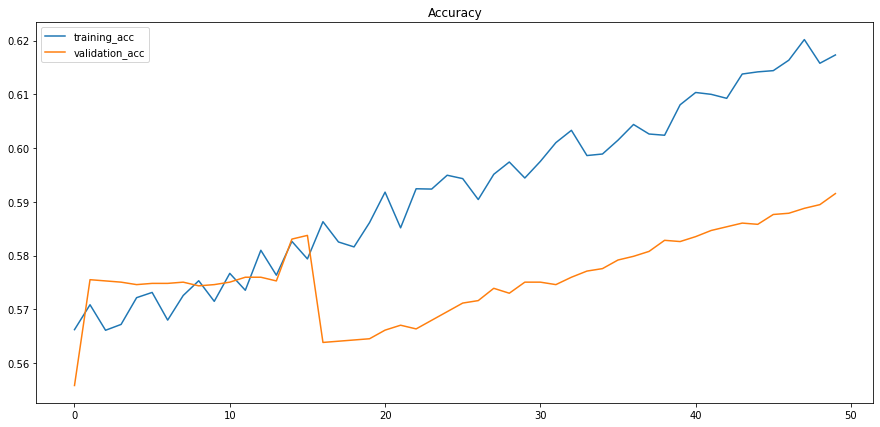

In [116]:
plt.figure(figsize=(15, 7))
plt.plot(range(epochs), history.history['accuracy'])
plt.plot(range(epochs), history.history['val_accuracy'])
plt.legend(['training_acc', 'validation_acc'])
plt.title('Accuracy')

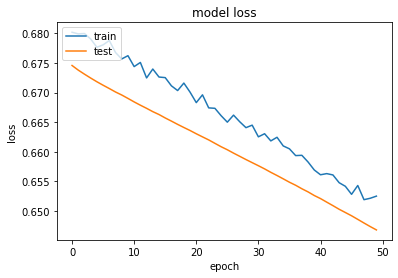

In [117]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [118]:
train_lstm_results = lstm_model.evaluate(xtrain_pad, np.asarray(ytrain), verbose=0, batch_size=256)
test_lstm_results = lstm_model.evaluate(xtest_pad, np.asarray(ytest), verbose=0, batch_size=256)
print(f'Train accuracy: {train_lstm_results[1]*100:0.2f}')
print(f'Test accuracy: {test_lstm_results[1]*100:0.2f}')

Train accuracy: 61.69
Test accuracy: 59.15


In [119]:
emb_dim = embedding_matrix.shape[1]
gru_model = Sequential()
gru_model.add(Embedding(vocab_len, emb_dim, trainable = False, weights=[embedding_matrix]))
gru_model.add(GRU(128, return_sequences=False))
gru_model.add(Dropout(0.5))
gru_model.add(Dense(1, activation = 'sigmoid'))
gru_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
print(gru_model.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, None, 300)         3000000   
_________________________________________________________________
gru (GRU)                    (None, 128)               165120    
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 129       
Total params: 3,165,249
Trainable params: 165,249
Non-trainable params: 3,000,000
_________________________________________________________________
None


In [120]:
#batch_size = 256
epochs  = 50
history = gru_model.fit(xtrain_pad, np.asarray(ytrain), validation_data=(xtest_pad,np.asarray(ytest)), epochs = epochs)

Epoch 1/50
547/547 [==============================] - 137s 250ms/step - loss: 0.4351 - accuracy: 0.7839 - val_loss: 0.5778 - val_accuracy: 0.7156
Epoch 2/50
547/547 [==============================] - 134s 246ms/step - loss: 0.2842 - accuracy: 0.8803 - val_loss: 0.6411 - val_accuracy: 0.7039
Epoch 3/50
547/547 [==============================] - 134s 244ms/step - loss: 0.2080 - accuracy: 0.9156 - val_loss: 0.7293 - val_accuracy: 0.7037
Epoch 4/50
547/547 [==============================] - 134s 244ms/step - loss: 0.1652 - accuracy: 0.9369 - val_loss: 0.8278 - val_accuracy: 0.6920
Epoch 5/50
547/547 [==============================] - 131s 239ms/step - loss: 0.1138 - accuracy: 0.9581 - val_loss: 0.9802 - val_accuracy: 0.6968
Epoch 6/50
547/547 [==============================] - 133s 242ms/step - loss: 0.0756 - accuracy: 0.9730 - val_loss: 1.1984 - val_accuracy: 0.6844
Epoch 7/50
547/547 [==============================] - 131s 240ms/step - loss: 0.0550 - accuracy: 0.9805 - val_loss: 1.3961 -

Text(0.5, 1.0, 'Accuracy')

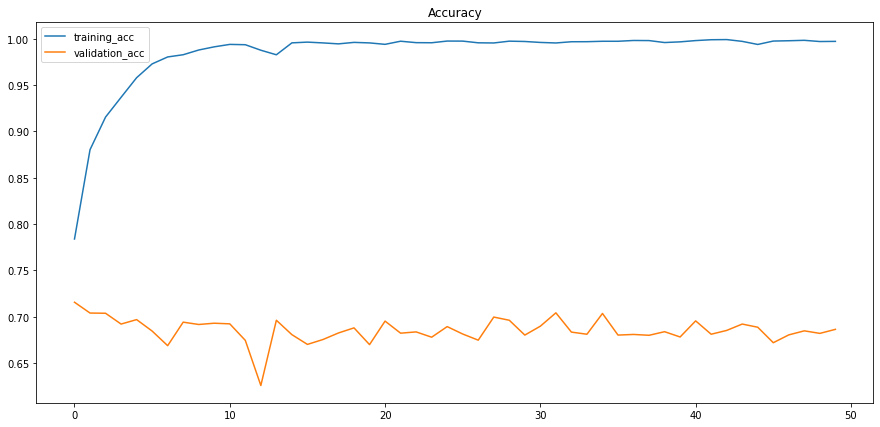

In [121]:
plt.figure(figsize=(15, 7))
plt.plot(range(epochs), history.history['accuracy'])
plt.plot(range(epochs), history.history['val_accuracy'])
plt.legend(['training_acc', 'validation_acc'])
plt.title('Accuracy')

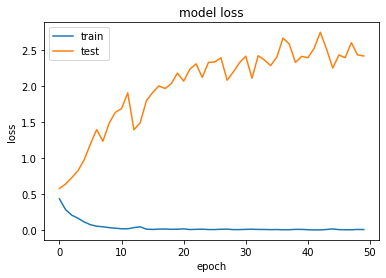

In [122]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [123]:
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers

In [124]:
inputs = keras.Input(shape=(None,), dtype="int32")
# Embed each integer in a 128-dimensional vector
x = layers.Embedding(vocab_len, 128)(inputs)
# Add 2 bidirectional LSTMs
x = layers.Bidirectional(layers.LSTM(64, return_sequences=True))(x)
x = layers.Bidirectional(layers.LSTM(64))(x)
# Add a classifier
outputs = layers.Dense(1, activation="sigmoid")(x)
model = keras.Model(inputs, outputs)
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None)]            0         
_________________________________________________________________
embedding_2 (Embedding)      (None, None, 128)         1280000   
_________________________________________________________________
bidirectional (Bidirectional (None, None, 128)         98816     
_________________________________________________________________
bidirectional_1 (Bidirection (None, 128)               98816     
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 129       
Total params: 1,477,761
Trainable params: 1,477,761
Non-trainable params: 0
_________________________________________________________________


In [125]:
model.compile("adam", "binary_crossentropy", metrics=["accuracy"])
history=model.fit(xtrain_pad, np.asarray(ytrain), validation_data=(xtest_pad, np.asarray(ytest)), epochs = epochs)

Epoch 1/50
547/547 [==============================] - 211s 386ms/step - loss: 0.2397 - accuracy: 0.8959 - val_loss: 0.8401 - val_accuracy: 0.6622
Epoch 2/50
547/547 [==============================] - 209s 383ms/step - loss: 0.0755 - accuracy: 0.9733 - val_loss: 1.1653 - val_accuracy: 0.6531
Epoch 3/50
547/547 [==============================] - 208s 381ms/step - loss: 0.0370 - accuracy: 0.9890 - val_loss: 1.4598 - val_accuracy: 0.6620
Epoch 4/50
547/547 [==============================] - 210s 384ms/step - loss: 0.0209 - accuracy: 0.9941 - val_loss: 1.6790 - val_accuracy: 0.6613
Epoch 5/50
547/547 [==============================] - 205s 374ms/step - loss: 0.0149 - accuracy: 0.9955 - val_loss: 1.9994 - val_accuracy: 0.6517
Epoch 6/50
547/547 [==============================] - 205s 375ms/step - loss: 0.0125 - accuracy: 0.9965 - val_loss: 2.0823 - val_accuracy: 0.6540
Epoch 7/50
547/547 [==============================] - 208s 380ms/step - loss: 0.0079 - accuracy: 0.9978 - val_loss: 2.0457 -

Text(0.5, 1.0, 'Accuracy')

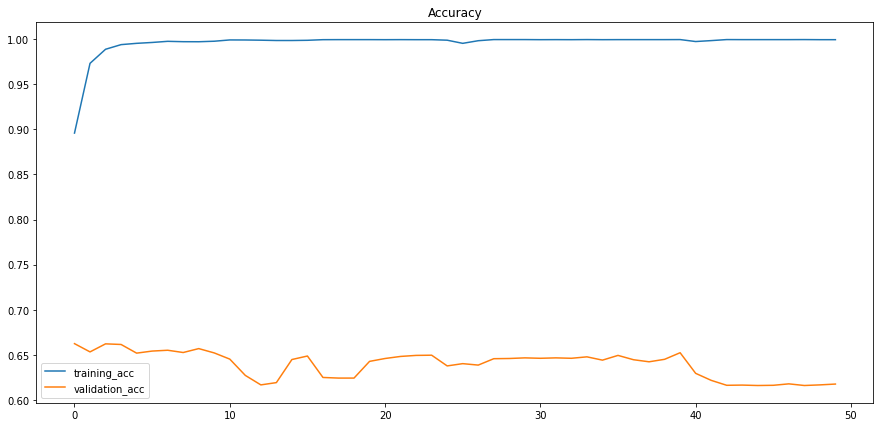

In [126]:
plt.figure(figsize=(15, 7))
plt.plot(range(epochs), history.history['accuracy'])
plt.plot(range(epochs), history.history['val_accuracy'])
plt.legend(['training_acc', 'validation_acc'])
plt.title('Accuracy')

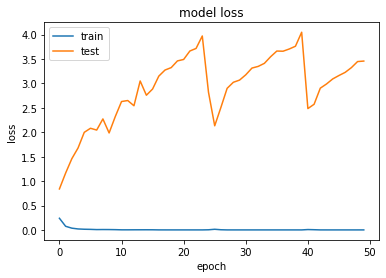

In [127]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [22]:
from torch.utils.data import Dataset, DataLoader
from itertools import chain

import torch
import torch.nn as nn
import torch.nn.functional as F

In [94]:
X, y = df.drop(['title', 'content', 'publication', 'label','text_standard','data_cleaned'], axis = 1), df['label']
le = LabelEncoder()
y = le.fit_transform(y)
y = y.reshape(-1,1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=69)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)
train_loader = DataLoader(dataset=train_data, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(dataset=test_data, batch_size=BATCH_SIZE, shuffle=True)

In [95]:
EPOCHS = 50
BATCH_SIZE = 64
LEARNING_RATE = 0.001
class trainData(Dataset):
    
    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data
        
    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]
        
    def __len__ (self):
        return len(self.X_data)


train_data = trainData(torch.FloatTensor(X_train), 
                       torch.FloatTensor(y_train))
## test data    
class testData(Dataset):
    
    def __init__(self, X_data):
        self.X_data = X_data
        
    def __getitem__(self, index):
        return self.X_data[index]
        
    def __len__ (self):
        return len(self.X_data)
    

test_data = testData(torch.FloatTensor(X_test))

In [96]:
class binaryClassification(nn.Module):
    def __init__(self):
        super(binaryClassification, self).__init__()
        # Number of input features is 109.
        self.layer_1 = nn.Linear(65, 64) 
        self.layer_2 = nn.Linear(64, 64)
        self.layer_out = nn.Linear(64, 1) 
        
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.1)
        self.batchnorm1 = nn.BatchNorm1d(64)
        self.batchnorm2 = nn.BatchNorm1d(64)
        
    def forward(self, inputs):
        x = self.relu(self.layer_1(inputs))
        x = self.batchnorm1(x)
        x = self.relu(self.layer_2(x))
        x = self.batchnorm2(x)
        x = self.dropout(x)
        x = self.layer_out(x)
        
        return x


In [97]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

import torch.optim as optim
model = binaryClassification()
model.to(device)
print(model)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)



cpu
binaryClassification(
  (layer_1): Linear(in_features=65, out_features=64, bias=True)
  (layer_2): Linear(in_features=64, out_features=64, bias=True)
  (layer_out): Linear(in_features=64, out_features=1, bias=True)
  (relu): ReLU()
  (dropout): Dropout(p=0.1, inplace=False)
  (batchnorm1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnorm2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)


In [98]:
def binary_acc(y_pred, y_test):
    y_pred_tag = torch.round(torch.sigmoid(y_pred))

    correct_results_sum = (y_pred_tag == y_test).sum().float()
    acc = correct_results_sum/y_test.shape[0]
    acc = torch.round(acc * 100)
    
    return acc

In [ ]:
accuracy_stats = {
    'train': [],
    "val": []
}
loss_stats = {
    'train': [],
    "val": []
}

In [113]:
model.train()

for e in range(1, EPOCHS+1):
    epoch_loss_train = 0
    epoch_acc_train = 0
    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        y_pred = model(X_batch)
        loss = criterion(y_pred, y_batch)
       # print(y_pred)
       # print(y_batch)
        acc = binary_acc(y_pred, y_batch)
       
        loss.backward()
        optimizer.step()
        
        epoch_loss_train += loss.item()
        epoch_acc_train += acc.item()

    epoch_loss_test = 0
    epoch_acc_test = 0
    for X_batch, y_batch in test_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        y_pred = model(X_batch)
        loss = criterion(y_pred, y_batch)
       # print(y_pred)
       # print(y_batch)
        acc = binary_acc(y_pred, y_batch)
       
        loss.backward()
        optimizer.step()
        
        epoch_loss_test += loss.item()
        epoch_acc_test += acc.item()
    loss_stats['train'].append(epoch_loss_train/len(train_loader))
    loss_stats['val'].append(epoch_loss_test/len(test_loader))
    accuracy_stats['train'].append(epoch_acc_train/len(train_loader))
    accuracy_stats['val'].append(epoch_acc_test/len(test_loader))

    #print(f'Epoch {e+0:03}: | Loss: {epoch_loss/len(test_loader):.5f} | Acc: {epoch_acc/len(test_loader):.3f}')
    print(f'Epoch {e+0:02}: | Train Loss: {epoch_loss_train/len(train_loader):.5f} | Val Loss: {epoch_loss_test/len(test_loader):.5f} | Train Acc: {epoch_acc_train/len(train_loader):.3f}| Val Acc: {epoch_acc_test/len(test_loader):.3f}')
    
          

Epoch 01: | Train Loss: 0.06644 | Val Loss: 0.05592 | Train Acc: 97.439| Val Acc: 97.757
Epoch 02: | Train Loss: 0.06120 | Val Loss: 0.05417 | Train Acc: 97.531| Val Acc: 97.825
Epoch 03: | Train Loss: 0.06522 | Val Loss: 0.04917 | Train Acc: 97.364| Val Acc: 98.097
Epoch 04: | Train Loss: 0.06200 | Val Loss: 0.05234 | Train Acc: 97.397| Val Acc: 97.864
Epoch 05: | Train Loss: 0.06327 | Val Loss: 0.05871 | Train Acc: 97.427| Val Acc: 97.602
Epoch 06: | Train Loss: 0.05975 | Val Loss: 0.04991 | Train Acc: 97.665| Val Acc: 97.932
Epoch 07: | Train Loss: 0.06043 | Val Loss: 0.05397 | Train Acc: 97.649| Val Acc: 98.010
Epoch 08: | Train Loss: 0.06121 | Val Loss: 0.04904 | Train Acc: 97.502| Val Acc: 97.951
Epoch 09: | Train Loss: 0.05662 | Val Loss: 0.05264 | Train Acc: 97.674| Val Acc: 97.670
Epoch 10: | Train Loss: 0.06034 | Val Loss: 0.05368 | Train Acc: 97.431| Val Acc: 98.078
Epoch 11: | Train Loss: 0.05374 | Val Loss: 0.05322 | Train Acc: 97.812| Val Acc: 97.825
Epoch 12: | Train Los

Text(0.5, 1.0, 'Train-Val Loss/Epoch')

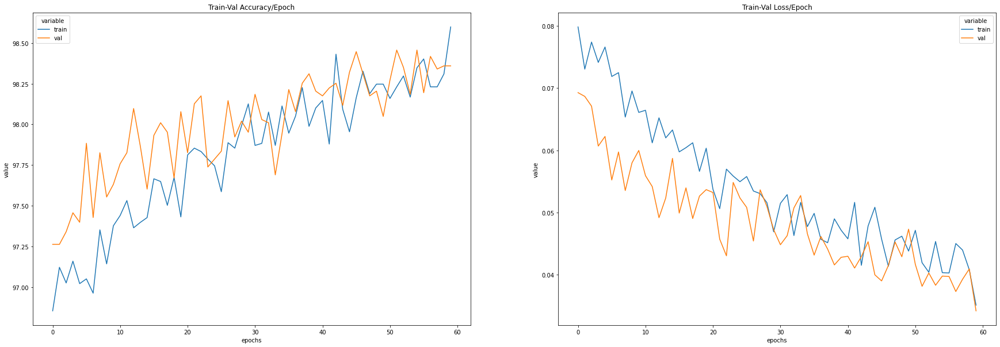

In [114]:
import seaborn as sns
train_val_acc_df = pd.DataFrame.from_dict(accuracy_stats).reset_index().melt(id_vars=['index']).rename(columns={"index":"epochs"})
train_val_loss_df = pd.DataFrame.from_dict(loss_stats).reset_index().melt(id_vars=['index']).rename(columns={"index":"epochs"})

# Plot line charts
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(30,10))
sns.lineplot(data=train_val_acc_df, x = "epochs", y="value", hue="variable",  ax=axes[0]).set_title('Train-Val Accuracy/Epoch')
sns.lineplot(data=train_val_loss_df, x = "epochs", y="value", hue="variable", ax=axes[1]).set_title('Train-Val Loss/Epoch')

In [112]:
EPOCHS = 50
BATCH_SIZE = 64
LEARNING_RATE = 0.001
class trainData(Dataset):
    
    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data
        
    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]
        
    def __len__ (self):
        return len(self.X_data)


train_data = trainData(torch.FloatTensor(X_train), 
                       torch.FloatTensor(y_train))
## test data    
class testData(Dataset):
    
    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data
        
    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]
        
    def __len__ (self):
        return len(self.X_data)
    

test_data = testData(torch.FloatTensor(X_test),
                     torch.FloatTensor(y_test))

X, y = df.drop(['title', 'content', 'publication', 'label','text_standard','data_cleaned'], axis = 1), df['label']
le = LabelEncoder()
y = le.fit_transform(y)
y = y.reshape(-1,1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=69)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)
train_loader = DataLoader(dataset=train_data, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(dataset=test_data, batch_size=BATCH_SIZE, shuffle=True)

In [60]:
y_pred_list = []
model.eval()
with torch.no_grad():
    for X_batch in test_loader:
        X_batch = X_batch.to(device)
        y_test_pred = model(X_batch)
        y_test_pred = torch.sigmoid(y_test_pred)
        y_pred_tag = torch.round(y_test_pred)
        y_pred_list.append(y_pred_tag.cpu().numpy())

y_pred_list = [a.squeeze().tolist() for a in y_pred_list]
print(classification_report(y_test, y_pred_list))

              precision    recall  f1-score   support

           0       0.63      0.62      0.62      3748
           1       0.51      0.53      0.52      2807

    accuracy                           0.58      6555
   macro avg       0.57      0.57      0.57      6555
weighted avg       0.58      0.58      0.58      6555

